# Process optimization by genetic algorithm

job j1~j5 are non-sequencial
load is a hour  needed to finish each job
number in row x>=3 is count of jobs

how can we assign jobs to each person to minimize total time span while keeping each persons time limit.


## Preparation

In [225]:
include("../../src/ProcGA.jl")

Main.ProcGA

In [2]:
using CSV,DelimitedFiles
using DataFrames,Missings
using Statistics
using Random

In [3]:
using Plots

In [4]:
gr()

Plots.GRBackend()

## reading data

Read machine definition table.
Jobs column defines which object to product.

In [5]:
ptbl = CSV.read("machine.csv",header = 1)

,name,hour,jobs
1,machine1,15,[1;2;3;4]
2,machine2,15,[5;6;7;8]
3,machine3,15,[1;2;3;4;5;6;7;8]


Read object table, these will be producted by those machines.
Pcs means how many objects is made by 1 injection shot.
Runtime is in hour.

In [6]:
otbl = CSV.read("objtable.csv",header=1)

,job,min,pc,qty,runtime,shotlimit,usehour,interval
1,SS,1.5,2,4000,88.8889,800,20,8
2,AS1,1.5,2,4000,88.8889,800,20,8
3,AS2,1.5,2,4000,88.8889,800,20,8
4,TS,1.5,2,2000,44.4444,800,20,8
5,BS,1.5,1,500,5.55556,800,20,8
6,CL1,2.0,2,3000,50.0,800,27,8
7,CL2,2.0,2,3000,50.0,800,27,8
8,ACL,2.0,2,100,1.66667,800,27,8
9,BCL,2.0,2,1000,16.6667,800,27,8
10,ECL,2.0,2,200,3.33333,800,27,8


In [7]:
# create joblist from object table
jlst = Array{Int,1}()
for i in 1:size(otbl,1)
    v = repeat([i],ceil(Int, otbl[:runtime][i]))
    append!(jlst,v)
end

In [8]:
length(jlst)

441

Assign this list to machines.

In [9]:
# columns needed to store enough assign table.
xcol = length(jlst)

441

In [10]:
# make zero table
gbs = zeros(Int,(size(ptbl,1),xcol))

3×441 Array{Int64,2}:
 0  0  0  0  0  0  0  0  0  0  0  0  0  …  0  0  0  0  0  0  0  0  0  0  0  0
 0  0  0  0  0  0  0  0  0  0  0  0  0     0  0  0  0  0  0  0  0  0  0  0  0
 0  0  0  0  0  0  0  0  0  0  0  0  0     0  0  0  0  0  0  0  0  0  0  0  0

In [11]:
# assign joblist to gbs
for i in 1:length(jlst)
    gbs[i] = jlst[i]
end

In [12]:
g0 = [gbs[i,:] for i in 1:size(gbs,1)]

3-element Array{Array{Int64,1},1}:
 [1, 1, 1, 1, 1, 1, 1, 1, 1, 1  …  0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
 [1, 1, 1, 1, 1, 1, 1, 1, 1, 1  …  0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
 [1, 1, 1, 1, 1, 1, 1, 1, 1, 1  …  0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

colsort to push 0 data last.

In [27]:
ProcGA.colsortjob!(g0)

3-element Array{Array{Int64,1},1}:
 [0, 0, 1, 1, 0, 0, 0, 2, 0, 0  …  0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
 [0, 1, 0, 0, 1, 1, 1, 0, 0, 0  …  0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
 [1, 0, 0, 0, 0, 0, 1, 0, 2, 2  …  0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

In [30]:
v = (ProcGA.colsumlist(g0))'

1×441 LinearAlgebra.Adjoint{Int64,Array{Int64,1}}:
 1  1  1  1  1  1  2  2  2  2  2  2  2  …  0  0  0  0  0  0  0  0  0  0  0  0

In [13]:
assignlist =[ eval(Meta.parse(x)) for x in ptbl[:jobs]]

3-element Array{Array{Int64,1},1}:
 [1, 2, 3, 4]            
 [5, 6, 7, 8]            
 [1, 2, 3, 4, 5, 6, 7, 8]

## Initialize table

In [226]:
ProcGA.settable([],[],[])

()

In [227]:
ProcGA.setassigntable(assignlist)

3-element Array{Array{Int64,1},1}:
 [1, 2, 3, 4]            
 [5, 6, 7, 8]            
 [1, 2, 3, 4, 5, 6, 7, 8]

## Defining penalty functions

You can give your own penalty function when needed.

### continuity

In [54]:
gs = copy(g0)

3-element Array{Array{Int64,1},1}:
 [0, 1, 1, 0, 0, 0, 0, 1, 1, 1  …  0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
 [1, 0, 0, 1, 1, 1, 0, 0, 0, 0  …  0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
 [0, 0, 0, 0, 0, 0, 1, 0, 0, 0  …  0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

In [31]:
usehour = Array{Int,1}(otbl[:usehour])
usehour'

1×10 LinearAlgebra.Adjoint{Int64,Array{Int64,1}}:
 20  20  20  20  20  27  27  27  27  27

Penalty table which excess usehour

In [55]:
pl = ProcGA.listcontinuity(g0,usehour)

3-element Array{Array{Int64,1},1}:
 [0, 0, 0, 0, 0, 0, 0, 0, 0, 0  …  0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
 [0, 0, 0, 0, 0, 0, 0, 0, 0, 0  …  0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
 [0, 0, 0, 0, 0, 0, 0, 0, 0, 0  …  0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

This can be used as a penalty point.

In [56]:
sum(sum(pl))

0

In [50]:
# running this multiple times makes g0 to be ordered correctly
# get penalty list, get penalty, swap loop
plst = ProcGA.listcontinuity(g0,usehour)
ProcGA.swapjob!.(g0,plst)
sum(sum(plst))

0

In [53]:
ProcGA.colsortjob!(g0)

3-element Array{Array{Int64,1},1}:
 [0, 1, 1, 0, 0, 0, 0, 1, 1, 1  …  0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
 [1, 0, 0, 1, 1, 1, 0, 0, 0, 0  …  0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
 [0, 0, 0, 0, 0, 0, 1, 0, 0, 0  …  0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

### intervals

In [64]:
function listusing(lst::Array{Int,1},id)
    [ x == id ? 1 : 0 for x in lst]
end

listusing (generic function with 1 method)

In [65]:
vn = listusing.(g0,1)
vn

3-element Array{Array{Int64,1},1}:
 [0, 1, 1, 0, 0, 0, 0, 1, 1, 1  …  0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
 [1, 0, 0, 1, 1, 1, 0, 0, 0, 0  …  0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
 [0, 0, 0, 0, 0, 0, 1, 0, 0, 0  …  0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

In [67]:
v = ProcGA.colsumlist(vn)
v'

1×441 LinearAlgebra.Adjoint{Int64,Array{Int64,1}}:
 1  1  1  1  1  1  1  1  1  1  1  1  1  …  0  0  0  0  0  0  0  0  0  0  0  0

In [109]:
# count excess of use hour 
function excesslist(tbl, id, lmt)
    vn = listusing.(tbl,id)
    v = ProcGA.colsumlist(vn)
    pl = zeros(Int,length(tbl[1]))

    used = false
    cnt = 0
    for i in 1:ProcGA.validlength(v)
        if v[i] > 0
            if !used 
                pl[i] = cnt > 0 ? cnt : 0
            end
            used = true
        else
            if !used
                cnt -=  1
            else
                cnt = lmt
            end
            used = false
        end
    end
    pl
end

excesslist (generic function with 1 method)

In [113]:
pl = excesslist(g0,2,otbl[:interval][1]);

In [114]:
sum(pl)

53

In [115]:
function totexcess(tbl)
    intv = otbl[:interval]
    pl = zeros(Int,length(tbl[1]))
    for i in 1:length(intv)
        lmt = intv[i]
        pl .+= excesslist(tbl,i,lmt)
    end
    pl
end

totexcess (generic function with 1 method)

In [119]:
pp = totexcess(g0);
pp[70:85]'

1×16 LinearAlgebra.Adjoint{Int64,Array{Int64,1}}:
 0  0  8  8  0  7  6  0  7  8  8  8  0  0  0  0

In [131]:
pdup = ProcGA.listduplicate(g0);

441-element Array{Int64,1}:
 0
 0
 0
 0
 0
 0
 0
 0
 0
 0
 0
 0
 0
 ⋮
 0
 0
 0
 0
 0
 0
 0
 0
 0
 0
 0
 0

In [136]:
# combination of penalties
# using usehour, intervals
function listpenalty(tbl)
    pcont = ProcGA.listcontinuity(tbl,usehour)
    prest = totexcess(tbl)
    pdup = ProcGA.listduplicate(tbl)
    
    pall = pcont .+ [prest,prest,prest] .+ [pdup,pdup,pdup]
    pall
end

listpenalty (generic function with 1 method)

In [139]:
pt = listpenalty(g0)

3-element Array{Array{Int64,1},1}:
 [0, 0, 0, 0, 0, 0, 0, 0, 0, 0  …  0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
 [0, 0, 0, 0, 0, 0, 0, 0, 0, 0  …  0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
 [0, 0, 0, 0, 0, 0, 0, 0, 0, 0  …  0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

In [140]:
sum(sum(pt))

1197

In [196]:
function mypenalty(tbl)
    plst = listpenalty(tbl)
    sum(sum(plst))
end

mypenalty (generic function with 1 method)

In [228]:
ProcGA.penalty(jtbl::Array{Array{Int,1},1}) = mypenalty(jtbl)

## Initialize population

In [187]:
savedfile = "bestprc_heuristics.csv"

"bestprc_heuristics.csv"

In [190]:
# create population from savedfile or make new
if isfile(savedfile)
    println("read from $savedfile")
    gbs = readdlm(savedfile, ',', Int)
    if size(gbs)[2] < size(g0)[2]
        # append zero
        c2 = size(gbs)[2]
        gbs = hcat(gbs,g0[:,(c2+1):end])
    end
    g0 = [ gbs[i,:] for i in 1:size(gbs,1) ]
else
    println("Use \"g0\" above.")
end
g0

Use "g0" above.


3-element Array{Array{Int64,1},1}:
 [0, 0, 1, 1, 0, 0, 0, 1, 0, 0  …  0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
 [0, 1, 0, 0, 0, 1, 0, 0, 0, 0  …  0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
 [1, 0, 0, 0, 1, 0, 1, 0, 1, 1  …  0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

Make population.
Half of it is from best data and latter half is randomly made.

In [217]:
if isfile(savedfile)
    ppl = ProcGA.populatefrom(g0,50);
    ppl = vcat(ppl, ProcGA.populateshuffle(g0,150));
else
    ppl = ProcGA.populateshuffle(g0,200);
end
ProcGA.colsortjob!.(ppl);

## Evolution!

In [219]:
# first sort ppl by their penalties
ProcGA.sortpopulation!(ppl);

In [220]:
v = ProcGA.penalty.(ppl);

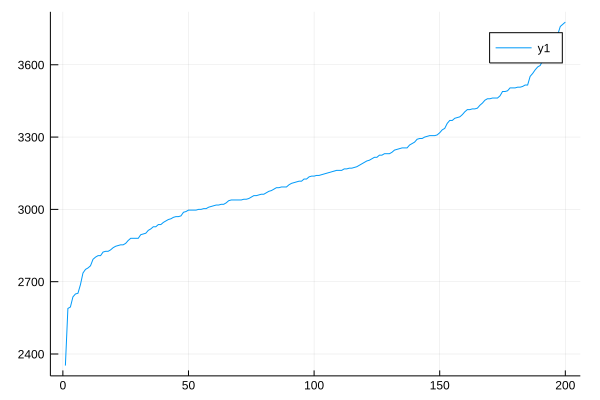

In [221]:
x = 1:length(v)
plot(x,v)

In [222]:
vlst = [[minimum(v), Int(round(median(v))), maximum(v)]]

1-element Array{Array{Int64,1},1}:
 [2352, 3140, 3777]

In [ ]:
# Proceed generation
# size, counter, survival rate, elite rate, mutation rate
# default rates : 0.8, 0.2, 0.05
# enable jobswitching between available rows
vl = ProcGA.evolution!(ppl, 100, 5, 0.5, 0.2, 0.1, true);
vlst = vcat(vlst,vl);

i:5 => [1377, 1875, 2859]
i:10 => [1212, 1608, 2634]
i:15 => [1123, 1503, 2580]
i:20 => [1071, 1395, 2607]
i:25 => [1068, 1071, 1656]
i:30 => [1029, 1071, 1833]


In [ ]:
y = (x->x[1]).(vlst);
x = 1:length(y);

plot(x,y)

Pick up the best data.

In [421]:
v = ProcGA.penalty.(ppl)
idm = findmin(v)[2]
bestgen = ppl[idm]

3×441 Array{Int64,2}:
 1  1  1  1  1  1  1  1  1  1  1  1  1  …  0  0  0  0  0  0  0  0  0  0  0  0
 0  0  0  0  0  5  0  0  0  0  0  0  0     0  0  0  0  0  0  0  0  0  0  0  0
 1  0  0  0  1  0  0  0  1  0  1  0  0     0  0  0  0  0  0  0  0  0  0  0  0

In [80]:
# save best process table to file.
# do not clip it so that it can be used again
writedlm("bestprc.csv",bestgen, ',')

## Conclusion

## check functions (test)

In [199]:
c1 = [1,2,3]
c2 = [2,3,4]
c3 = [3,4,5]
cc = [c1,c2,c3]

3-element Array{Array{Int64,1},1}:
 [1, 2, 3]
 [2, 3, 4]
 [3, 4, 5]

In [205]:
d = deepcopy(cc)

3-element Array{Array{Int64,1},1}:
 [0, 2, 3]
 [2, 3, 4]
 [3, 4, 5]

In [207]:
d[1][1] = 1

1

In [208]:
d

3-element Array{Array{Int64,1},1}:
 [1, 2, 3]
 [2, 3, 4]
 [3, 4, 5]

In [209]:
cc

3-element Array{Array{Int64,1},1}:
 [0, 2, 3]
 [2, 3, 4]
 [3, 4, 5]

In [213]:
[cc[1:1],d[2:3]]

2-element Array{Array{Array{Int64,1},1},1}:
 [[0, 2, 3]]           
 [[2, 3, 4], [3, 4, 5]]

In [428]:
for i in 1:100 
    ProcGA.switchjob!(bestgen)
end

In [220]:
c1,c2 = ProcGA.crossover(ppl[2],ppl[3])

([0 0 … 0 0; 0 0 … 0 0; 1 1 … 0 0], [0 0 … 0 0; 0 0 … 0 0; 1 1 … 0 0])

In [327]:
c1 == c2

false

In [328]:
checkpenalties.([ppl[2],ppl[3]])

2-element Array{NTuple{4,Int64},1}:
 (252, 0, 0, 80)
 (252, 0, 0, 80)

In [329]:
checkpenalties.([c1,c2])

2-element Array{NTuple{4,Int64},1}:
 (273, 0, 0, 80) 
 (252, 60, 0, 80)

In [330]:
ProcGA.switchjob!(c1)

3×294 Array{Int64,2}:
 0  0  0  0  1  0  0  1  0  0  0  0  0  …  0  0  0  0  0  0  0  0  0  0  0  0
 0  0  0  0  0  2  0  0  4  0  0  5  5     0  0  0  0  0  0  0  0  0  0  0  0
 1  1  1  1  0  1  1  0  1  1  1  1  1     0  0  0  0  0  0  0  0  0  0  0  0

In [331]:
checkpenalties(c1)

(273, 0, 0, 80)

In [240]:
function switchjob1!(jtbl::Array{Int,2}, atbl = ProcGA.assigntable)
    rw = size(jtbl,1)
    col = ProcGA.validlength(jtbl)
    
    r1 = rand(1:rw)
    c1 = rand(1:col)
    r2 = sample(ProcGA.findassignnum(r1,atbl),1)[1]
    c2 = sample(1:col,1)[1]
    jtbl[r1,c1],jtbl[r2,c2] = jtbl[r2,c2], jtbl[r1,c1]
    println("($r1,$c1): <=> ($r2,$c2)")
    jtbl[r1,c1], jtbl[r2,c2]
end

switchjob1! (generic function with 2 methods)

In [332]:
switchjob1!(c1)

(2,166): <=> (3,31)


(1, 0)

In [333]:
checkpenalties(c2)

(252, 60, 0, 80)